# **Project Report - Group 37**

## Group members:
- Nadia Khalil Arjomandi
- Savero Lukianto Chandra 
- Brianna De Souza 
- Sophia Sheng

# Income Prediction Analysis: Determining the Likelihood of Earning Over 50,000 dollars Based on Age, Enducational Level, Capital Loss, Capital Gain, and Work Hours

# I. Introduction

The project aims to develop a predictive model/question to determine if a person earns over 50,000 dollars a year, focusing on factors such as age, capital loss, capital gain, work hours per week, and educational level. This question is relevant not only to the project but also to real-world applications in policymaking and marketing (Dechadilok & Suksawang, 2017). The rationale is based on the observation that young adults with lower educational levels, typically with limited disposable income and smaller investments, might have lesser capital gains or losses. In contrast, middle-aged adults with higher educational levels, likely in their peak earning years, may have larger investments and a higher likelihood of exceeding the 50,000-dollar income threshold (Larrimore et al., 2021). Older adults could have diverse financial situations, some accumulating wealth and others with reduced earnings post-retirement. The "Adult" dataset from the 1994 Census, available in the UCI Machine Learning Repository, is used for this analysis. The project's main objective is to accurately identify individuals earning above $50,000 annually, distinguishing between middle and higher-income groups in the U.S. This project aims to understand the determinants of financial success. 

Word count = 179


# II. Methods

## 1) Preliminary Data Analysis

### i. Installing the Required Libraries

In [2]:
library(tidyverse)
library(dplyr)
library(repr)
library(tidymodels)
library(ggplot2)
library(cowplot)

Warning message:
“package ‘ggplot2’ was built under R version 4.3.2”
── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.3     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.0
✔ ggplot2   3.5.0     ✔ tibble    3.2.1
✔ lubridate 1.9.2     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
── Attaching packages ────────────────────────────────────── tidymodels 1.1.1 ──

✔ broom        1.0.5     ✔ rsample      1.2.0
✔ dials        1.2.0     ✔ tune         1.1.2
✔ infer        1.0.5     ✔ workflows    1.1.3
✔ modeldata    1.2.0     ✔ workflowsets 1.0.1
✔ parsnip      1.1.1     ✔ yardstick    1.2.0
✔ recipes      1.0.8     

── Conflicts ───────────────────────────────────────── tidymodels_co

### ii. Reading the Dataset into R

In [3]:
# The URL that contains the data set.
url <- "https://raw.githubusercontent.com/Syzophia/dsci100-group-37-project/main/adult.data"

# Reading the data set.
adult_data <- read.csv(url) 

# Showing the first 6 rows of the raw data.
head(adult_data)

,X39,State.gov,X77516,Bachelors,X13,Never.married,Adm.clerical,Not.in.family,White,Male,X2174,X0,X40,United.States,X..50K
,<int>,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<chr>,<chr>
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
5,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K
6,49,Private,160187,9th,5,Married-spouse-absent,Other-service,Not-in-family,Black,Female,0,0,16,Jamaica,<=50K


### iii. Wrangling and Cleaning Data into a Tidy Format

#### A. Giving Readable Column Names for the Data Set

In [4]:
# First, we rename the columns to improve the readability of the data frame.

# assigning column names for the data frame.
colnames (adult_data) <- c("age", "workclass", "fnlwgt", "education", "education_level", "marital_status",
                            "occupation", "relationship", "race", "sex", "capital_gain", "capital_loss", 
                            "weekly_work_hours", "native_country", "income")
head(adult_data)

,age,workclass,fnlwgt,education,education_level,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,weekly_work_hours,native_country,income
,<int>,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<chr>,<chr>
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
5,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K
6,49,Private,160187,9th,5,Married-spouse-absent,Other-service,Not-in-family,Black,Female,0,0,16,Jamaica,<=50K


#### B. Choosing the Country to Focus on
We focus our classification project on one country, the USA, because in real life, some factors that affect one's income are country-dependent. People in different countries have different difficulties in gaining 50,000 USD.

Word count = 33

In [5]:
# Summarize the count of each country in the data set.
list_of_countries <- adult_data |> 
            group_by(native_country) |> 
            summarize (count = n()) |> 
            arrange(-count)
# In the table below, we can see that most people reside in the US. Afterward, we only take into account the people
# whose native country is the US.
# In the table below, we also found 583 missing points for the native_country variable.
head(list_of_countries)

native_country,count
<chr>,<int>
United-States,29169
Mexico,643
?,583
Philippines,198
Germany,137
Canada,121


In [6]:
# Modifying the data frame so that only the data points having the US as their native country are included.
adult_data |> filter (native_country == "United-States") 
head(adult_data)

age,workclass,fnlwgt,education,education_level,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,weekly_work_hours,native_country,income
<int>,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<chr>,<chr>


,age,workclass,fnlwgt,education,education_level,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,weekly_work_hours,native_country,income
,<int>,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<chr>,<chr>
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
5,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K
6,49,Private,160187,9th,5,Married-spouse-absent,Other-service,Not-in-family,Black,Female,0,0,16,Jamaica,<=50K


#### C. Selecting Relevant Variables for the Classification Model
To perform the classification algorithm, we need to convert `income` into a `fct` data type and only select numerical variables for the predictors.

Word count = 23

In [7]:
# Selecting the columns associated which numerical variables, continued by converting income into a factor variable.
adult_data <- adult_data |> select (age, education_level, capital_gain, capital_loss, weekly_work_hours, income) |>
                            mutate (income = as_factor(income))
head(adult_data)

,age,education_level,capital_gain,capital_loss,weekly_work_hours,income
,<int>,<int>,<int>,<int>,<int>,<fct>
1,50,13,0,0,13,<=50K
2,38,9,0,0,40,<=50K
3,53,7,0,0,40,<=50K
4,28,13,0,0,40,<=50K
5,37,14,0,0,40,<=50K
6,49,5,0,0,16,<=50K


#### D. Splitting the Data Frame into a Training Set and a Testing Set

In [8]:
set.seed(3278)
# splitting the data frame into a training set and a testing set.
# in this project, 70% data is used as the training set.
adult_split <- initial_split (adult_data, prop = 0.7, strata = income)
adult_training <- training(adult_split)
adult_testing <- testing (adult_split)

#### E. Summarizing the Key Features in the Training Data Set
1) **Table 1: Number of observations and variables**

In [9]:
dimension <- tibble (dim (adult_training))
dimension
# The table shows that the training data set has 22791 rows and 6 columns.

dim(adult_training)
<int>
22791
6


2. **Table 2: Average of all predictors**

In [10]:
# Select all columns in the training data set except income.
# Then, calculate the average of each predictor while removing missing data points.
pred_mean <- adult_training |> select (- income) |>
                               map_df (mean, na.rm = TRUE)
pred_mean

age,education_level,capital_gain,capital_loss,weekly_work_hours
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
38.58176,10.08262,1065.055,86.60796,40.40398


3. **Table 3: Number of missing data points**

In [11]:
nas <- adult_training |> select (- income) |>
                    map_df (mean, na.rm = TRUE) |>
                    mutate(na_count = sum(is.na (adult_training)))
nas
# Apparently, there is no missing data point in our training data set.

age,education_level,capital_gain,capital_loss,weekly_work_hours,na_count
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>
38.58176,10.08262,1065.055,86.60796,40.40398,0


4. **Table 4: Median of all predictors**

In [12]:
# Select all columns in the training data set except income.
# Then, calculate the median of each predictor while removing missing data points.
pred_median <- adult_training |> select (- income) |>
                               map_df (median, na.rm = TRUE)
pred_median

age,education_level,capital_gain,capital_loss,weekly_work_hours
<int>,<int>,<int>,<int>,<int>
37,10,0,0,40


### iv. Visualizing Data

#### A. Visualizing the distribution of age

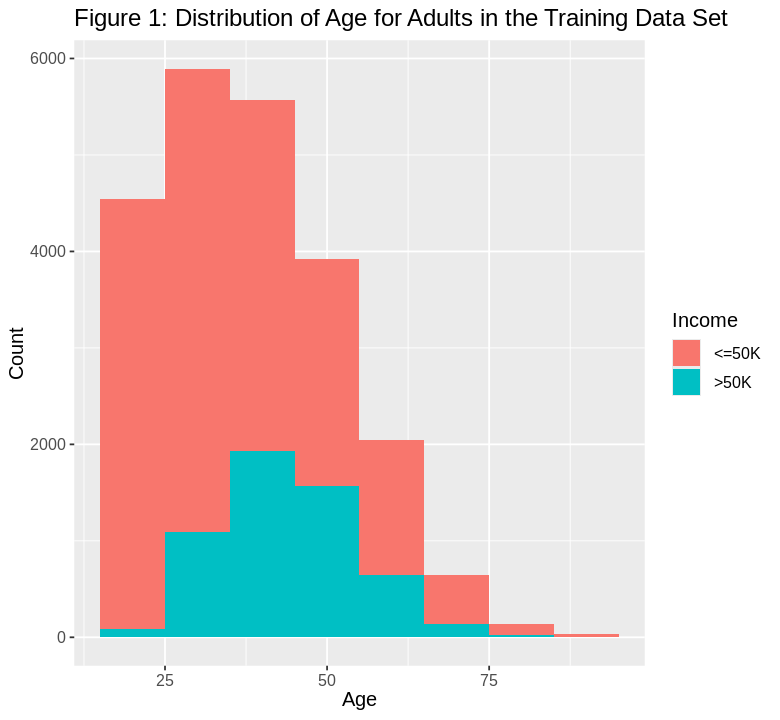

In [13]:
options(repr.plot.height = 6, repr.plot.width = 6.5)
age_histogram <- adult_training |> ggplot (aes (x = age, fill = income)) + 
              geom_histogram(binwidth = 10) + 
              labs(x = "Age", y = "Count", fill = "Income", title = "Figure 1: Distribution of Age for Adults in the Training Data Set") +
              theme (text = element_text (size = 12))
age_histogram

This visual is attached to the report because it conveys how income distribution varies with age. For example, the graph can show if there's a particular age range where earnings above $50,000 are more common, which can be an indicator of peak earning years. 
In the context of model development, the histogram is particularly valuable. It can influence decisions on how to treat the age variable within the predictive model. Seeing where there are significant differences in income distribution across ages can guide the creation of age categories or the transformation of the age variable, potentially enhancing the model's ability to predict income levels.

(Word count = 104)


#### B. Visualizing the distribution of education level

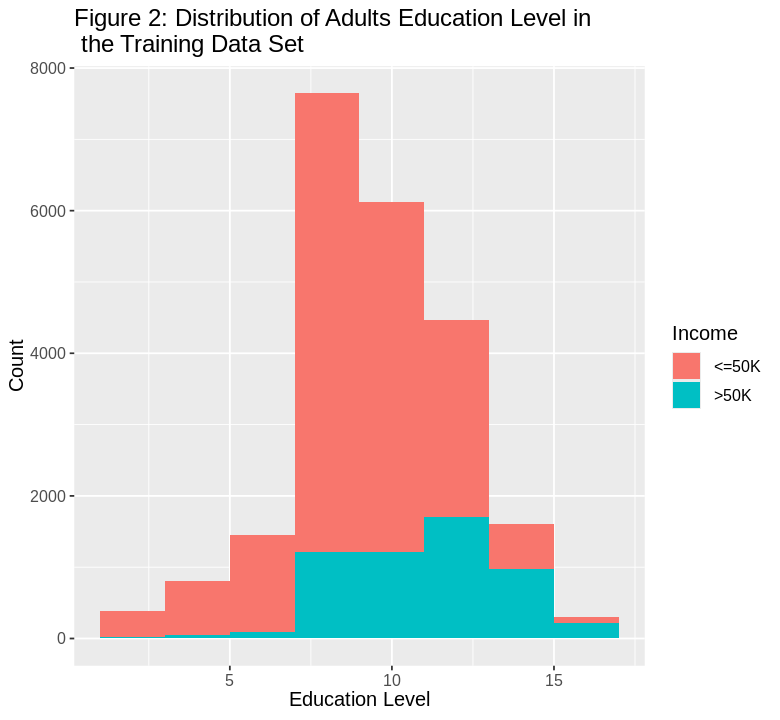

In [14]:
edu_histogram <- adult_training |> ggplot (aes (x = education_level, fill = income)) + 
              geom_histogram(binwidth = 2) + 
              labs(x = "Education Level", y = "Count", fill = "Income", title = "Figure 2: Distribution of Adults Education Level in \n the Training Data Set") +
              theme (text = element_text (size = 12))
edu_histogram

The histogram offers a visual comparison between educational levels and income, revealing that individuals with higher education tend to fall more frequently in the higher income bracket, which is highlighted by the Cyan bars. This trend is less pronounced for those with lower educational levels, as indicated by the predominance of red bars at the lower end of the education spectrum. The graph shows the importance of education as a variable in the income prediction model and suggests a strong correlation between the level of education attained and the likelihood of earning over $50,000 annually. Such insights are essential for model accuracy, confirming the need to prioritize education in the predictive analysis.

(Word count = 112)

#### C. Visualizing the distribution of capital gain

<ScaleContinuousPosition>
 Range:  
 Limits:    0 --    1

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
Warning message in scale_y_continuous(trans = "log"):
“log-2.718282 transformation introduced infinite values.”
Warning message:
“Removed 44 rows containing missing values or values outside the scale range
(`geom_bar()`).”


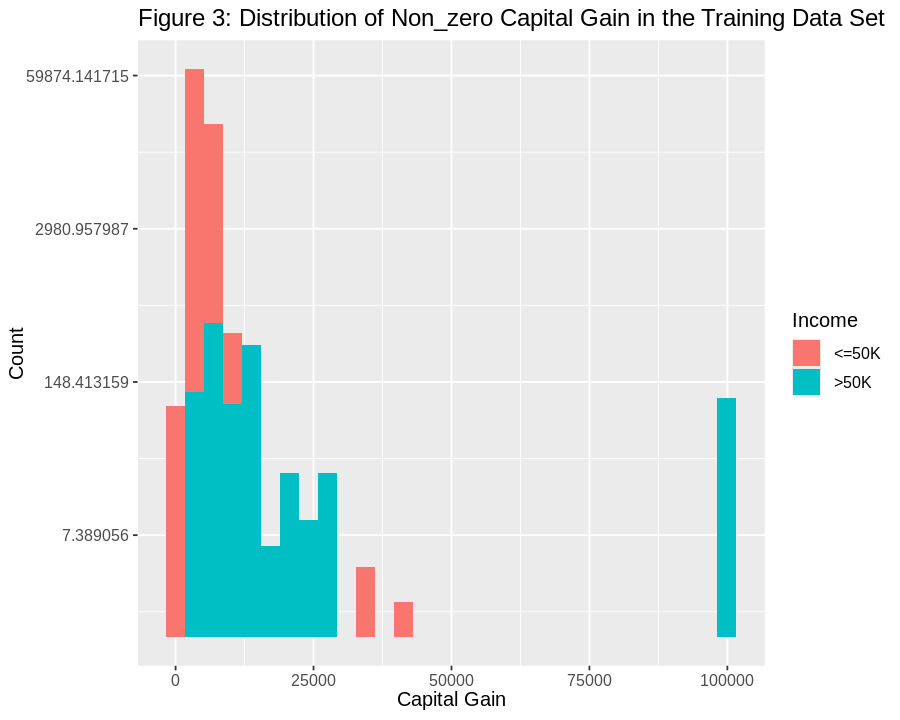

In [15]:
#Here the points of the y-axis and x_axis are far apart, and we need to zoom in on the image in the lower right corner to visualize the results.
options(repr.plot.height = 6, repr.plot.width = 7.5)
capital_gain_plot <- adult_training|>
      filter (capital_gain != 0)|>
      ggplot(aes(x = capital_gain, fill = income)) +
      geom_histogram() +
      labs(title = "Figure 3: Distribution of Non_zero Capital Gain in the Training Data Set",
           x = "Capital Gain",
           y = "Count",
           fill= "Income")+
        theme (text = element_text (size = 12))+
          scale_y_continuous(trans = 'log') 
          scale_x_continuous(trans = 'log')
capital_gain_plot 

This histogram visualizes the distribution of non-zero capital gains within the training dataset, broken down by income level. The x-axis, represented on a logarithmic scale due to the wide range of capital gains, shows the amount of capital gain, while the y-axis indicates the number of individuals who have experienced these gains. A notable observation from this histogram is that higher capital gains are predominantly associated with the higher income group (cyan), indicating a potential correlation between capital gains and higher earnings. Including this histogram in the analysis is crucial, as it indicates that capital gains could be a significant predictor of income level, supporting the model. 

(Word count = 107)

#### D. Visualizing the distribution of capital loss

<ScaleContinuousPosition>
 Range:  
 Limits:    0 --    1

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
Warning message in scale_y_continuous(trans = "log"):
“log-2.718282 transformation introduced infinite values.”
Warning message:
“Removed 26 rows containing missing values or values outside the scale range
(`geom_bar()`).”


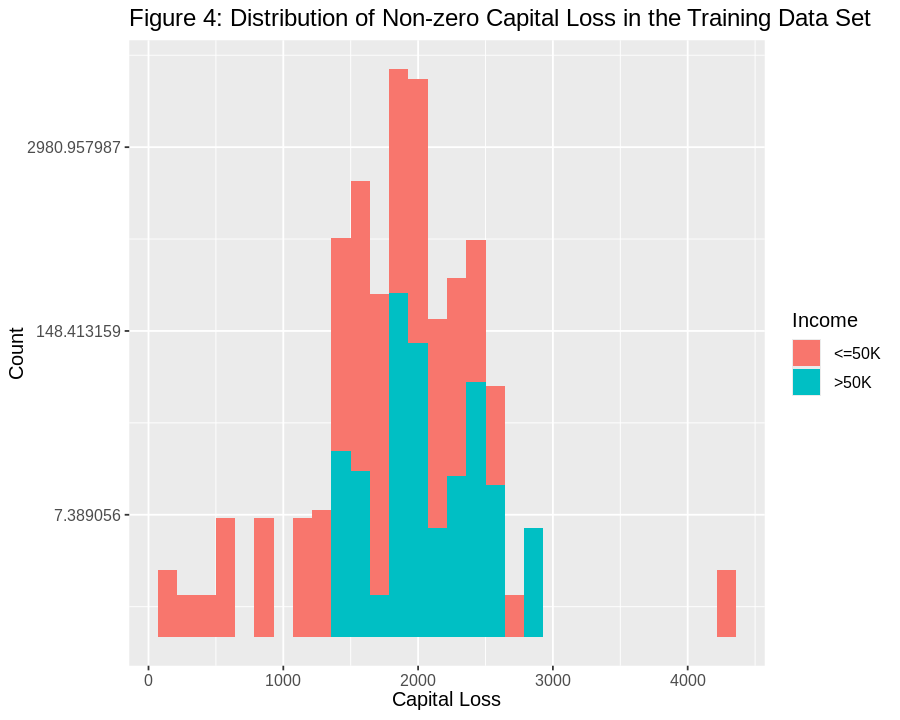

In [16]:
capital_loss_plot <- adult_training|>
      filter (capital_loss!= 0)|>
      ggplot(aes(x = capital_loss, fill = income)) +
      geom_histogram() +
      labs(title = "Figure 4: Distribution of Non-zero Capital Loss in the Training Data Set",
           x = "Capital Loss",
           y = "Count",
           fill= "Income")+
        theme (text = element_text (size = 12))+
          scale_y_continuous(trans = 'log') 
          scale_x_continuous(trans = 'log')
capital_loss_plot 

This histogram visualizes the distribution of non-zero capital losses within the training dataset, broken down by income level. The x-axis, represented on a logarithmic scale due to the wide range of capital losses, shows the amount of capital loss, while the y-axis indicates the number of individuals who have experienced these gains. A notable observation from this histogram is that higher capital gains are predominantly associated with the higher income group (cyan), indicating a potential correlation between capital gains and higher earnings. This holds despite some high capital losses associated with individuals with less than `$` 50,000 annual salary. Including this histogram in the analysis is crucial, as it indicates that capital losses could be a significant predictor of income level, supporting the model.

(Word count = 123)

#### E. Visualizing the distribution of weekly work hours

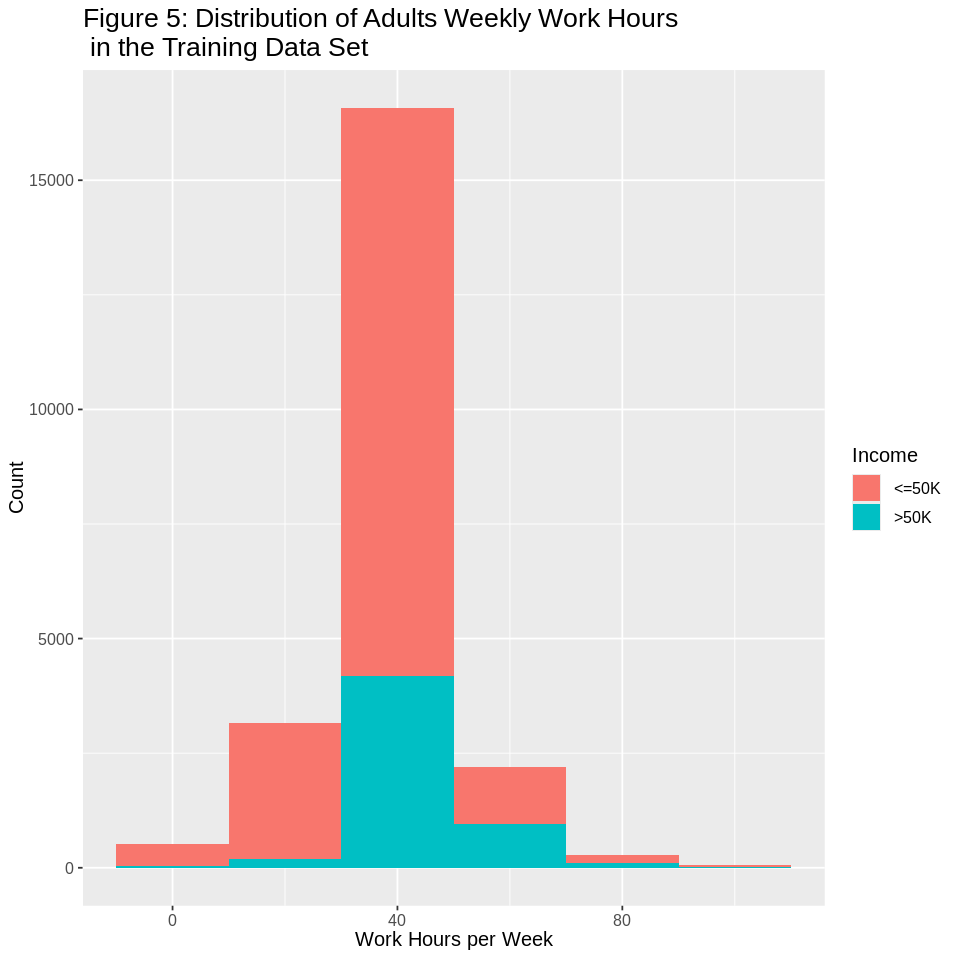

In [17]:
options(repr.plot.height = 8, repr.plot.width = 8)
weekly_work_hours_histogram <- adult_training |> 
              ggplot (aes (x = weekly_work_hours, fill = income)) + 
              geom_histogram(binwidth = 20) + 
              labs(x = "Work Hours per Week", y = "Count", fill = "Income", title = "Figure 5: Distribution of Adults Weekly Work Hours \n in the Training Data Set") +
              theme (text = element_text (size = 12),
              plot.title = element_text(size =16))
weekly_work_hours_histogram

The histogram provides insight into the distribution of adults' weekly work hours, distinguished by income, with red bars for those earning below $50,000 and cyan for the higher earners. The data suggests that there is a correlation between working hours and income level, with both low and high-income earners commonly working around the standard 40-hour workweek, yet also showing a diverse range of hours among the lower and higher earners. This indicates that work hours do contribute to income levels, but the relationship is not purely linear and may be influenced by other factors such as job type, industry, or salary structures.

(Word count = 102)

## 2) Data Analysis

We create a binary classifier predicting whether one's income exceeds $ 50k by using the KNN classification. Our data set contains 15 columns, but we only select numerical parameters as the predictors.

- We use `age` as a predictor because we observed a higher prevalence of middle-aged people who earn more than  $ 50k in the exploratory data analysis, indicating the influence of age in determining one's income.
- We use `education_level`, `capital_gain`, `capital_loss`, and `weekly_work_hours` because the plots in the exploratory phase show positive relationships between each variable and `income`. For example, the positive relationship between `capital gain` and `income` can be seen in Figure 4 as all of the people with approximately `$`100,000 capital gain have more than `$`50k annual income.

So far, we have divided the data set into a training (70%) and testing set (30%) using `income` as the strata argument. Next, we use `tune()` to determine the best $K$, number of nearest neighbors. Finally, we proceed with the regular procedure in performing the KNN classification.

(word count = 166)

### i. Creating KNN Recipe, Tuning Model, and Workflow

Our first step is to find the number of nearest neighbors $K$ to maximize the performance of our classifier by doing cross-validation with 5 folds. We continue by creating a recipe that will be used in the entire project followed by creating the tuning of our model. Finally, using a workflow, we collect our matrix that describes the level of accuracy for various $K$ values. We can decide the value of $K$ for the classifier by visualizing and finding the peak of the graph that shows the relationship between accuracy and $K$.

(Word count = 92)

In [40]:
set.seed(3278)
# Peforming cross-validation with 5 folds.
adult_vfold <- vfold_cv(adult_training, v = 5, strata = income)

# Creating the recipe.
# We scale and center all predictors so that each variable contributes equally as a predictor in our classification model.
adult_recipe <- recipe(income ~. , data = adult_training) |>
   step_scale(all_predictors()) |>
   step_center(all_predictors())

# Creating the tuning model.
knn_tune <- nearest_neighbor (weight_func = 'rectangular', neighbors = tune()) |> 
            set_engine('kknn') |>
            set_mode ('classification')

# Creating a workflow that combines the recipe and the model specification. 
# We choose grid = 10 in this process.
knn_results <- workflow() |>
       add_recipe(adult_recipe) |>
       add_model(knn_tune) |>
       tune_grid(resamples = adult_vfold, grid = 20) |>
       collect_metrics()

**Table 5: Metric Results of the Classification Model**

In [41]:
head(knn_results)

neighbors,.metric,.estimator,mean,n,std_err,.config
<int>,<chr>,<chr>,<dbl>,<int>,<dbl>,<chr>
1,accuracy,binary,0.7983416,5,0.002094454,Preprocessor1_Model01
1,roc_auc,binary,0.6566676,5,0.001384666,Preprocessor1_Model01
2,accuracy,binary,0.7993507,5,0.001431003,Preprocessor1_Model02
2,roc_auc,binary,0.7023182,5,0.002759858,Preprocessor1_Model02
3,accuracy,binary,0.8126889,5,0.001450540,Preprocessor1_Model03
3,roc_auc,binary,0.7258021,5,0.002567352,Preprocessor1_Model03


### ii. Determining the Value of $K$

We filter `knn_results` and only keep the rows for which the `.metric` column equals `accuracy`.

(Word count = 15)

**Table 6: Accuracy obtained from various $K$ values.**

In [42]:
accuracies <- knn_results |> 
       filter(.metric == 'accuracy')
head(accuracies)

neighbors,.metric,.estimator,mean,n,std_err,.config
<int>,<chr>,<chr>,<dbl>,<int>,<dbl>,<chr>
1,accuracy,binary,0.7983416,5,0.002094454,Preprocessor1_Model01
2,accuracy,binary,0.7993507,5,0.001431003,Preprocessor1_Model02
3,accuracy,binary,0.8126889,5,0.001450540,Preprocessor1_Model03
4,accuracy,binary,0.8137421,5,0.001420040,Preprocessor1_Model04
5,accuracy,binary,0.8150583,5,0.001764852,Preprocessor1_Model05
6,accuracy,binary,0.8159797,5,0.001688404,Preprocessor1_Model06


Next, we visualize the accuracy as a function of the number of neighbors by using a line graph.

(Word count = 18)

Warning message:
“Removed 7 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 7 rows containing missing values or values outside the scale range
(`geom_line()`).”


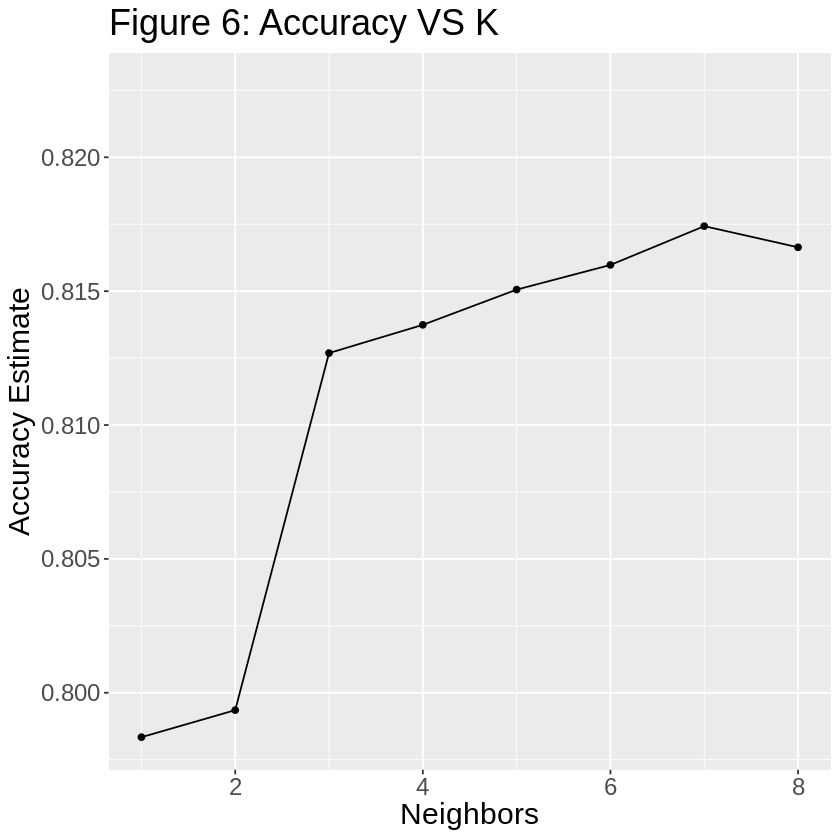

In [43]:
options(repr.plot.height = 7, repr.plot.width = 7)
accuracy_versus_k <- ggplot(accuracies, aes(x = neighbors, y = mean)) +
       geom_point() +
       geom_line() +
       labs(x = "Neighbors", y = "Accuracy Estimate", title = "Figure 6: Accuracy VS K")+
       scale_x_continuous(limits = c(1, 8)) +
       theme (text = element_text (size = 18))
accuracy_versus_k

From the graph above, the maximum accuracy is attained for $K=7$. Therefore, we will continue building our classifier using this value.

(Word count = 21)

### iii. Finalizing the Classifier Model

In [44]:
# Creating a new tuning model with K = 7.
knn_final_tune <- nearest_neighbor (weight_func = 'rectangular', neighbors = 7) |> 
            set_engine('kknn') |>
            set_mode ('classification')

# Fitting the model to the training dataset
adult_fit <- workflow() |>
       add_recipe(adult_recipe) |>
       add_model(knn_final_tune) |>
       fit(data = adult_training)

adult_fit

══ Workflow [trained] ══════════════════════════════════════════════════════════
Preprocessor: Recipe
Model: nearest_neighbor()

── Preprocessor ────────────────────────────────────────────────────────────────
2 Recipe Steps

• step_scale()
• step_center()

── Model ───────────────────────────────────────────────────────────────────────

Call:
kknn::train.kknn(formula = ..y ~ ., data = data, ks = min_rows(7,     data, 5), kernel = ~"rectangular")

Type of response variable: nominal
Minimal misclassification: 0.1691457
Best kernel: rectangular
Best k: 7

## 3) Model Perfomance 

### i. Assessing Model Accuracy 

After developing our classifier, we would like to investigate its accuracy in making predictions corresponding to the training dataset.

(Word count = 19)

**Table 7: Accuracy of the Classifier**

In [45]:
adult_predictions <- predict(adult_fit, adult_testing) |>
    bind_cols(adult_testing)

adult_accuracy <- adult_predictions |>
    metrics(truth = income, estimate = .pred_class) |>
    filter(.metric == "accuracy") |>
    select(-.estimator)

adult_accuracy

.metric,.estimate
<chr>,<dbl>
accuracy,0.8151295


Apparently, our model is 81.5% accurate. This is not a bad value but we would expect to achieve a higher accuracy to better distinguish between middle-class and high-income groups in the US. 

### ii.  Evaluate performance

**Table 8: First level based on predictions.**

In [46]:
head(adult_predictions) 
adult_predictions |> pull(income) |> levels()

.pred_class,age,education_level,capital_gain,capital_loss,weekly_work_hours,income
<fct>,<int>,<int>,<int>,<int>,<int>,<fct>
<=50K,50,13,0,0,13,<=50K
<=50K,49,5,0,0,16,<=50K
<=50K,52,9,0,0,45,>50K
<=50K,23,13,0,0,30,<=50K
<=50K,32,12,0,0,50,<=50K
<=50K,40,11,0,0,40,>50K


[1] " <=50K" " >50K"

This shows that  " <=50K" is the first level.

In [47]:
confusion <- adult_predictions |>
             conf_mat(truth = income, estimate = .pred_class)
confusion

          Truth
Prediction  <=50K  >50K
     <=50K   7025  1415
     >50K     391   938

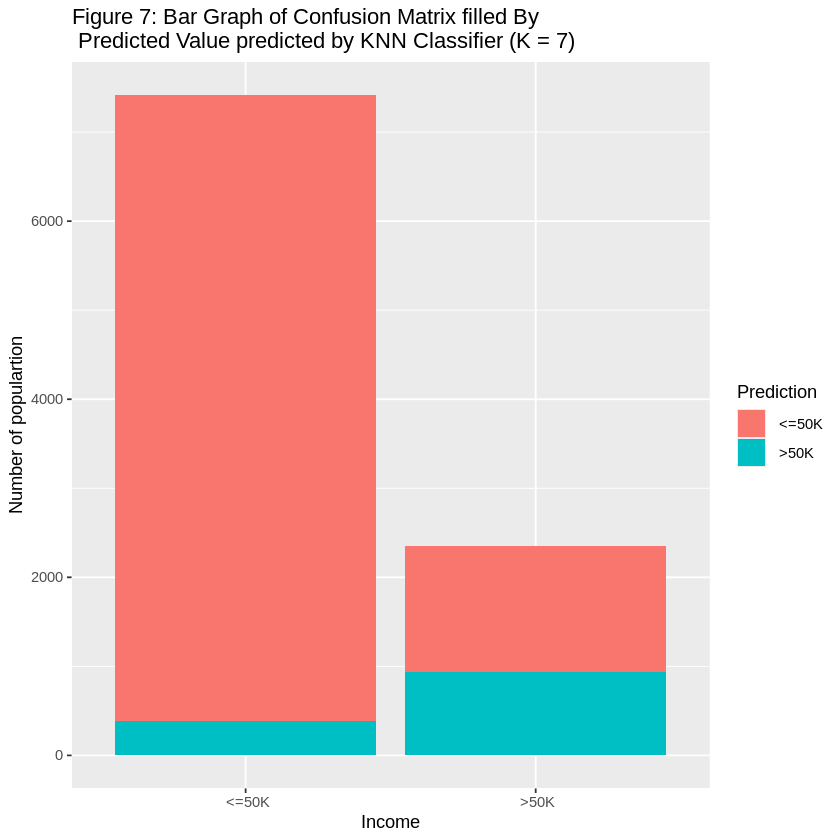

In [48]:
adult_pred_graph <-adult_predictions|>
    group_by(income)|>
    ggplot(aes(x = income, fill = .pred_class))+
    geom_bar()+
    labs(x = "Income", y = "Number of populartion", fill = "Prediction")+
    ggtitle("Figure 7: Bar Graph of Confusion Matrix filled By \n Predicted Value predicted by KNN Classifier (K = 7)")
adult_pred_graph

Based on the bar graph above, we can see that our model works well to predict if an individual's annual income is less than `$`50,000. However, due to an imbalance of population size between affluent and middle-class individuals, further improvements can still be made for our model to accurately predict individuals with more than `$`50,000 annual income.

(Word count = 57)

In [49]:
adult_predictions |>
  precision(truth = income, estimate = .pred_class, event_level = "first")

.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
precision,binary,0.832346


In [50]:
adult_predictions |>
  recall(truth = income, estimate = .pred_class, event_level = "first")

.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
recall,binary,0.9472762


### iii. Summary of the Findings

**Table 9: Summary of the Findings.**

In [51]:
summary_of_analysis = matrix(c("Income", "Age, Education level, Capital gain, Capital loss, Weekly work hours","K = 7", "81.5%"), ncol = 1, byrow = TRUE) 

rownames(summary_of_analysis) <- c("Response variable", "Predictors used", "Optimal K", "Classifier's estimated accuracy on test data")
colnames(summary_of_analysis) <- c("Findings")

analysis <- as.data.frame(summary_of_analysis) 

analysis
paste('Summary of the Key Information of the Built Classifier')

,Findings
,<chr>
Response variable,Income
Predictors used,"Age, Education level, Capital gain, Capital loss, Weekly work hours"
Optimal K,K = 7
Classifier's estimated accuracy on test data,81.5%


[1] "Summary of the Key Information of the Built Classifier"

## 4) Visualizing Results

### i. Education level vs. Age Shaped by Explicit Test Data with Correctly labeled and Predicted labels Graphs Side By Side

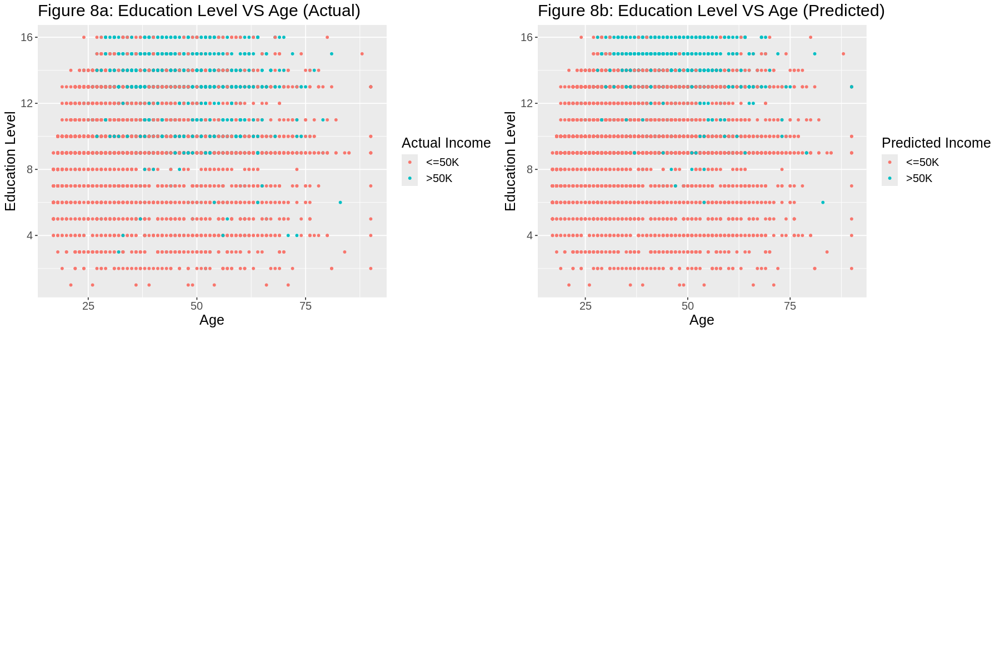

In [59]:
options(repr.plot.height = 10, repr.plot.width = 15)
age_education_actual_plot <- ggplot(adult_predictions, aes(x = age, y = education_level, color = income)) +
    geom_point(size = 1) +
    labs(x = 'Age', y = 'Education Level', color = 'Actual Income') +
    theme(plot.title = element_text(hjust = 0),text = element_text(size = 15)) +
    ggtitle('Figure 8a: Education Level VS Age (Actual)')
age_education_predict_plot <- ggplot(adult_predictions, aes(x = age, y = education_level, color = .pred_class)) +
    geom_point(size = 1) +
    labs(x = 'Age', y = 'Education Level', color = 'Predicted Income') +
    theme(plot.title = element_text(hjust = 0),text = element_text(size = 15)) +
    ggtitle('Figure 8b: Education Level VS Age (Predicted)')
age_education_compare <- plot_grid(age_education_actual_plot, age_education_predict_plot, ncol = 2, NULL)
age_education_compare

### ii. Weekly work hours vs. Age Shaped by Explicit Test Data with Correctly labelled and Predicted labels Graphs Side By Side

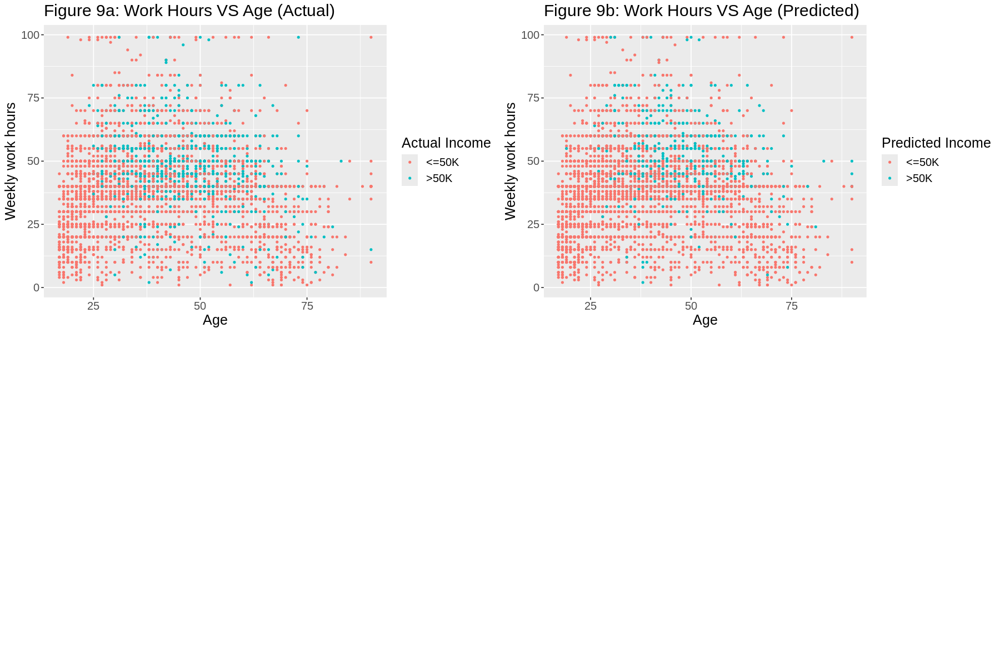

In [60]:
age_work_hours_actual_plot <- ggplot(adult_predictions, aes(x = age, y = weekly_work_hours, color = income)) +
    geom_point(size = 0.8) +
    labs(x = 'Age', y = 'Weekly work hours', color = 'Actual Income') +
    theme(plot.title = element_text(hjust = 0),text = element_text(size = 15)) +
    ggtitle('Figure 9a: Work Hours VS Age (Actual)')
age_work_hours_predict_plot <- ggplot(adult_predictions, aes(x = age, y = weekly_work_hours, color = .pred_class)) +
    geom_point(size = 0.8) +
    labs(x = 'Age', y = 'Weekly work hours', color = 'Predicted Income') +
    theme(plot.title = element_text(hjust = 0),text = element_text(size = 15)) +
    ggtitle('Figure 9b: Work Hours VS Age (Predicted)')
age_work_hours_compare <- plot_grid(age_work_hours_actual_plot, age_work_hours_predict_plot, ncol = 2, NULL)
age_work_hours_compare

### iii. Capital Gain vs. Capital Loss Shaped by Explicit Test Data with Correctly labeled and Predicted labels Graphs Side By Side

We decided not to visualize this relationship since most of the individuals in the data frame have zero capital loss and capital gain. Consequently, there will be a lot of overlapping points around the origin. Additionally, interpretations of Figure 8 and 9 will be provided in the discussion section below.

(Word count = 50)

# III. Discussion

Through thorough exploratory data analysis, KNN classification, and visualizations, we were able to gain valuable insights into the relationship between demographic and socioeconomic factors and an individual’s likelihood of earning `$`50,000 annually. Initially, we expected to find a positive correlation between age and incomes exceeding `$`50k. We predicted that older individuals would have higher incomes on average, in comparison to younger individuals, as with more seniority and experience in the workforce, they are able to develop a more valuable skill set which results in higher salaries. Furthermore, those who have been in the workforce for a longer period of time will likely have had greater opportunities to move up in rank within their respective positions, taking on roles that have greater responsibilities, and therefore higher salaries. In contrast to our initial expectation of a straightforward positive correlation, our analysis revealed that while older individuals generally tend to have higher incomes on average, there were exceptions within each age group. We observed that the positive relationship between age and salaries over `$`50k peaked around middle-aged individuals, after which it generally declined from there on with further increases in age. This trend could be due to a variety of factors; however, we assume one of the main reasons is that individuals may reach a plateau or experience diminished earnings in terms of salary as they progress into the late stages of their respective careers. Furthermore, as individuals approach retirement age, their health may impact their ability or willingness to work long hours or maintain high-stress jobs that are associated with greater salaries. As a result of prioritizing their health, they may transition to less demanding roles or work fewer hours, resulting in a slight salary decrease. Our findings could be influential for individuals approaching retirement age, as the insights from this analysis could be used to make informed decisions regarding when to retire and financial planning strategies. Moreover, our findings aligned with our initial expectation that individuals with a higher level of education would be more likely to obtain salaries greater than `$`50k. Therefore, the combination of these findings indicates that middle-aged individuals with a high level of education are more likely to surpass the `$`50k threshold. 

 Additionally, we initially assumed that there would be a positive correlation between longer work hours and income. Based on the data, the majority of people work around 40 hours per week, with both low and higher earners working within this range. A smaller portion of people work around 20 hours per week, and the data indicates that it is highly unlikely for individuals whose work hours fall within this range to earn salaries over `$`50k. Furthermore, the data shows that although there is a much smaller percentage of people who work over 40 hours per week, these individuals are more likely than those working less than 40 hours to obtain an income greater than `$`50k. However, it should be noted that within the range of individuals working 40 hours per week or more, salaries under `$`50k were still more prevalent than salaries over `$`50k. This suggests that while work hours do contribute to income levels to some degree, it is not the strongest predictor of financial success, and the relationship is not purely linear. Other factors such as industry and job type may have a greater influence on an individual’s likelihood of exceeding the `$`50k salary. This poses the question “What combination of work hours and job types are most likely to offer salaries over `$`50?” For example, there may be certain job types which require employees to work over 40 hours per week and pay them over `$`50k; however, there may be a profession in another industry that requires fewer work hours but pays the same amount. Exploring this question would allow individuals to consider career options in a field that roughly adheres to comfortable work hours, in order to allow for a good work-life balance, in which they can still be financially stable. 

(Word count = 660)



# IV. References

- Dechadilok, C., & Suksawang, P. (2017). Effect of marketing communication on income levels and lottery purchasing behavior in central thailand. Review of Integrative Business and Economics Research, 6(4), 15-27.
- 
Larrimore, J., Burkhauser, R. V., Auten, G., & Armour, P. (2021). Recent trends in US income distributions in tax record data using more comprehensive measures of income including real accrued capital gains. The Journal of Political Economy, 129(5), 1319-1360. https://doi.org/10.1086/713098

Total word count = 1913